# Social network project


## Network summary

### Network source and the description of preprocessing steps

I'm going to analyze my ego network from social network **vk.com** where nodes are my friends (except me) and edges are friendship.

To collect the data I am going to use VK API and python. Let's download this library for our work.

In [1]:
!pip install vk_api

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.6/48.6 kB 832.0 kB/s eta 0:00:00


Now let's import all the libraries we will need.

In [2]:
import vk_api

import numpy as np
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm

import warnings
warnings.filterwarnings('ignore')

sns.set_style('darkgrid')

Then log in to vk.com and download all the information we need. As additional information (future node attributes in graph) to the friends let's besides of user_ids download my their first names, last names and sex.

In [3]:
login = 'login'
password = 'password' 
vk_session = vk_api.VkApi(login, password)
vk_session.auth()
vk = vk_session.get_api()

In [4]:
friends = vk.friends.get(fields=['first_name', 'last_name', 'sex'])
friends_count = friends["count"]
friends_items = friends["items"]

Let's create a graph, where nodes are my friends (except me) and edges are friendship.

In [5]:
G = nx.Graph()

for i in range(friends_count):
    G.add_node(
        friends_items[i]["id"], 
        first_name = friends_items[i]['first_name'], 
        last_name = friends_items[i]['last_name'],
        sex = friends_items[i]['sex']
    )

for i in tqdm(range(friends_count)):
    try:
        temp_id = friends_items[i]["id"]
        temp_ff = vk.friends.get(user_id=temp_id)["items"]
        for ff_id in list(set(G.nodes).intersection(temp_ff)):
            G.add_edge(temp_id, ff_id)
    except:
        G.remove_node(temp_id)

100%|██████████| 182/182 [01:57<00:00,  1.55it/s]


We can plot our graph (pretty drawings to come next):

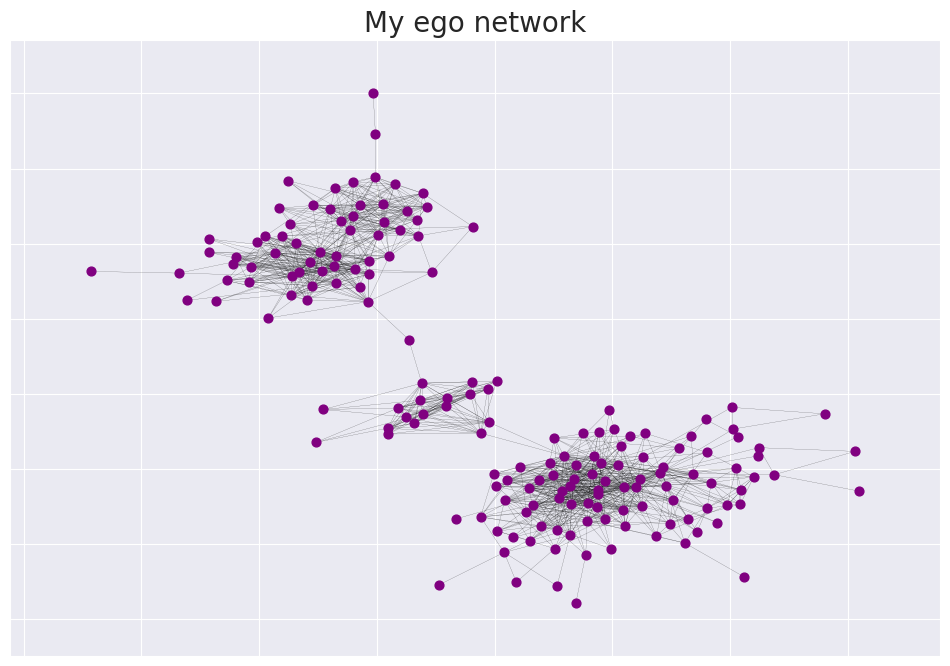

In [9]:
plt.figure(figsize=(12, 8))
nx.draw_networkx(
    G = G,
    pos = nx.kamada_kawai_layout(G),
    with_labels = False,
    node_size = 40,
    node_color = "purple",
    width = 0.1,
)
plt.title("My ego network", fontsize=20)
plt.show()

Here we can see some nodes in the image that don't have connections with the gigantic connected component (GCC). Let's just delete them because of their non-infomativity and make our final graph connected. 

In [10]:
gcc = max(nx.connected_components(G), key=len)
print("Nodes to delete:", len(G.nodes) - len(gcc))
G = G.subgraph(gcc)

Nodes to delete: 0


Thus, we get the next final image!

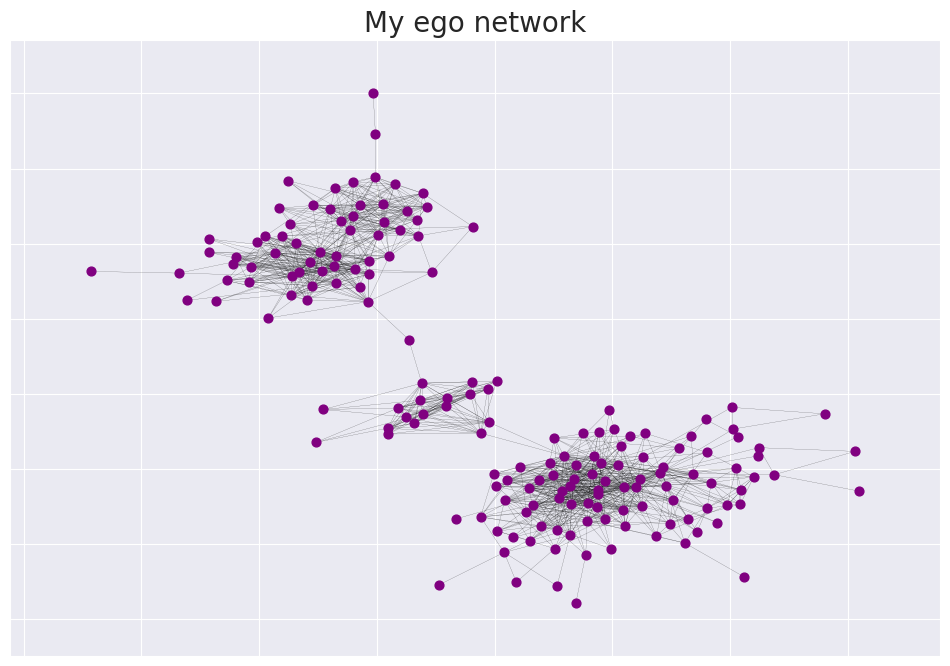

In [8]:
plt.figure(figsize=(12, 8))
nx.draw_networkx(
    G = G,
    pos = nx.kamada_kawai_layout(G),
    with_labels = False,
    node_size = 40,
    node_color = "purple",
    width = 0.1,
)
plt.title("My ego network", fontsize=20)
plt.show()

Three communities can clearly be seen here: school friends, friends from the MIREA (undergraduate) and friends from the HSE (graduate). 

### Type of the graph

Let's summarise what we have got so far.

Our graph is
* **undirected** - my graph consists of people who are in friendship with each other, so if we use directed graph, we will have arrows in both directions, so we just don't need them (directions);
* **homogeneous** - all the nodes represent instances of the same type and all the edges represent relations of the same type;
* **unweighted** - the edges represent friendship relations that is equal for all nodes, so we don't need weightes on edges;
* **connected** - we left only gigantic connected component, removing the 7 vertices (they were non-infomative).

Let's continue our research and calculate other statistics for the graph.

### Node/Edge attributes

All vertices in the graph are defined with the user_id of my friends. Also, to each user_id I additionally loaded my friends' **first name, last name and sex** (sex=1 - female; sex=2 - male) - these data became **attributes of the graph's nodes**. And there are **no attributes for graph edges**.

In [12]:
nodes_attr = set([key for node in G.nodes for key in G.nodes[node].keys()])
edges_attr = set([key for edge in G.edges for key in G.edges[edge].keys()])

print("Nodes attributes:", nodes_attr if len(nodes_attr) else None)
print("Edges attributes:", edges_attr if len(edges_attr) else None)

Nodes attributes: {'last_name', 'first_name', 'sex'}
Edges attributes: None


### Number of nodes and edges

**Order** of a graph is the number of vertices in the graph.

**Size** of a graph is the number of edges in the graph.

In [11]:
print("Order of G =", G.order())
print("Size of G =", G.size())

Order of G = 171
Size of G = 1195


### Diameter, radius

Path in a graph is a distance between any two nodes of the graph.

**Diameter** of a graph is the largest shortest path in the graph.

**Radius** of a graph is the smallest among all the largest paths between from one node to all others in the graph.

In [13]:
print("Diameter of G =", nx.diameter(G))
print("Radius of G =", nx.radius(G))

Diameter of G = 12
Radius of G = 6


### Clustering coefficient (global, average local, histogram)

**Transitivity of a graph (global clustering coefficient)**:
$$T = \frac{3 \cdot \text{number of triangles (triads)
}}{\text{number of connected triplets of vertices}}.$$

**Local clustering coefficient (per vertex)**:
$$C_i = \frac{\text{number of links in } N_i}{k_i(k_i - 1) / 2},$$
$$\text{where}\ \ N_i - \text{neighbours of temp vertex i},\ k_i=|N_i|.$$

**Average clustering coefficient**:
$$\overline{C} = \frac{1}{n} \sum^{n}_{i=1} C_i,\ \ \text{where}\ n - \text{total number of nodes}.$$


In [14]:
print("Global clustering coefficient =", round(nx.transitivity(G), 6))
print("Average clustering coefficient =", round(nx.average_clustering(G), 6))

Global clustering coefficient = 0.541345
Average clustering coefficient = 0.615446


And let's take a look at the clustering coefficient distribution.

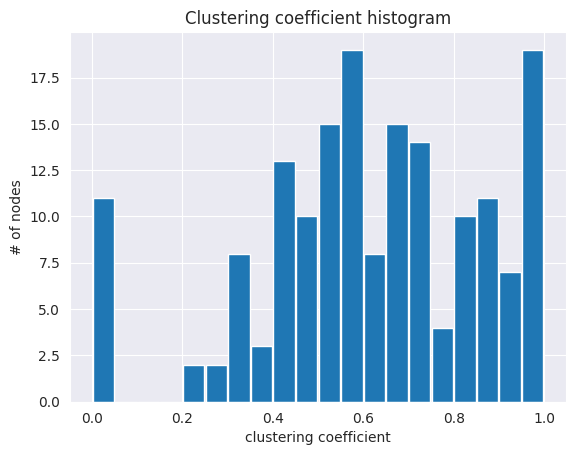

In [15]:
plt.hist(nx.clustering(G).values(), bins=20, rwidth=0.95)
plt.title("Сlustering coefficient histogram")
plt.xlabel("clustering coefficient")
plt.ylabel("# of nodes")
plt.show()

### Average path length (histogram)

Let's first look at the average shortest path length of the graph. It is just an average shortest path length between all nodes.

In [16]:
print("Average shortest path length =", round(nx.average_shortest_path_length(G), 6))

Average shortest path length = 4.594427


Now, move on to the histogram

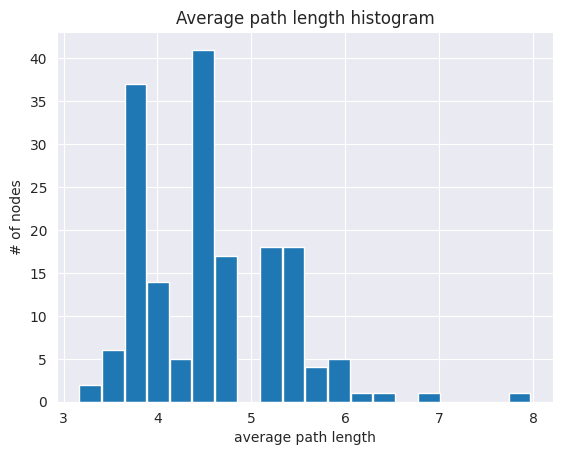

In [17]:
plt.hist([np.mean(list(paths.values())) for _, paths in nx.shortest_path_length(G)], bins=20, rwidth=0.95)
plt.title("Average path length histogram")
plt.xlabel("average path length")
plt.ylabel("# of nodes")
plt.show()

### Degree distribution, fitted models by regression and MLE with KS-test

Let's see some statistics about degrees in our graph.

In [18]:
degrees = np.array(sorted((d for n, d in G.degree()), reverse=True))
print("Min degree =", degrees.min())
print("Max degree =", degrees.max())
print("Average degree =", round(degrees.mean(), 6))

Min degree = 1
Max degree = 42
Average degree = 13.976608


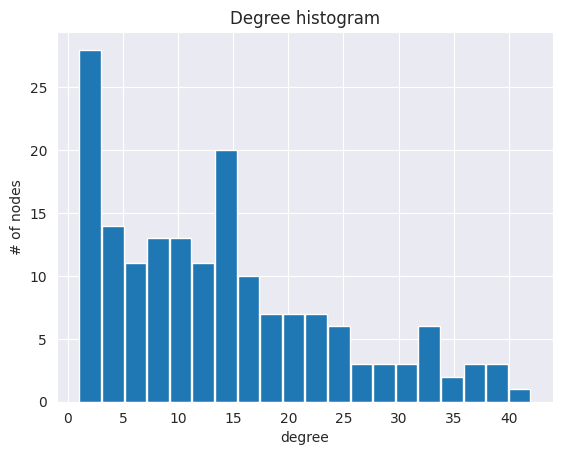

In [19]:
plt.hist(degrees, bins=20, rwidth=0.95)
plt.xlabel("degree")
plt.ylabel("# of nodes")
plt.title("Degree histogram")
plt.show()

It looks like real Power law (many nodes with small degree, small number of nodes with big degree), but due to the small amount of data, we get outliers.

Now, let's plot empirical PDF and CDF for our data in normal and logarithmic scales.

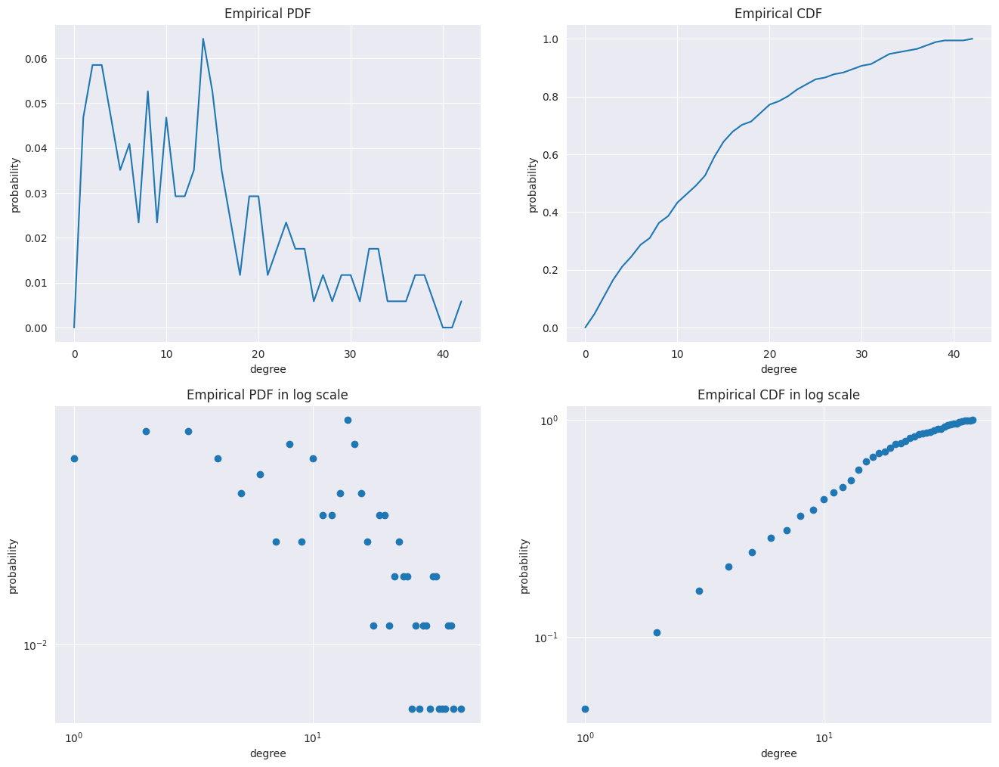

In [20]:
def empirical_cdf(g: nx.Graph):
    hist = nx.degree_histogram(g)
    return np.cumsum(hist) / np.sum(hist)

def empirical_pdf(g: nx.Graph):
    hist = nx.degree_histogram(g)
    return hist / np.sum(hist)

e_pdf = empirical_pdf(G)
e_cdf = empirical_cdf(G)

fig, axs = plt.subplots(2, 2, figsize=(16, 12))

axs[0, 0].plot(e_pdf)
axs[0, 0].set_xlabel("degree")
axs[0, 0].set_ylabel("probability")
axs[0, 0].set_title("Empirical PDF")

axs[0, 1].plot(e_cdf)
axs[0, 1].set_xlabel("degree")
axs[0, 1].set_ylabel("probability")
axs[0, 1].set_title("Empirical CDF")

axs[1, 0].loglog(e_pdf, marker='o', linestyle='None')
axs[1, 0].set_xlabel("degree")
axs[1, 0].set_ylabel("probability")
axs[1, 0].set_title("Empirical PDF in log scale")

axs[1, 1].loglog(e_cdf, marker='o', linestyle='None')
axs[1, 1].set_xlabel("degree")
axs[1, 1].set_ylabel("probability")
axs[1, 1].set_title("Empirical CDF in log scale")

plt.show()

We know that social networks distributed as Power law. Let's find optimal hyperparameters for estimating our graph distribution and power law.

In [21]:
def power_law_pdf(x, alpha=3.5, x_min=1):
    C = (alpha - 1) / x_min ** (1 - alpha)
    return C * x ** (-alpha)

def power_law_cdf(x, alpha=3.5, x_min=1):
    return 1 - x ** (-alpha + 1) / x_min ** (-alpha + 1)

def power_law_ppf(r, alpha=3.5, x_min=1):
    return (1 - r) ** (1 / (-alpha + 1)) * x_min

The first method to use is **regression**. Here we try to estimate $\alpha$ in $p(x) = Cx^{-\alpha}$. 
I am going to draw an empirical PDF with logarithmic binning (linear binning has performed poorly) in log-log scale and apply linear regression (by linear binning I mean to keep a bin width is fixed).

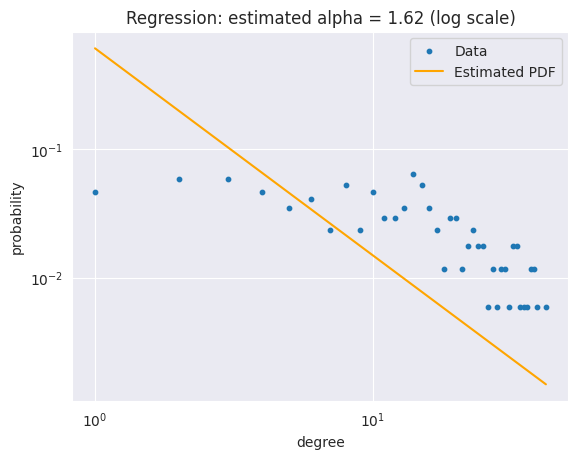

In [22]:
from sklearn.linear_model import LinearRegression

def alpha_lin_bins(x_train, bins):
    hist, bin_edges = np.histogram(x_train, bins=bins, density=True)
    bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2
    idx = np.argwhere(hist > 0)
    log_centers = np.log(bin_centers[idx][:, 0]).reshape(-1, 1)
    log_prob = np.log(hist[idx])
    lr = LinearRegression(fit_intercept=True)
    lr.fit(log_centers, log_prob)
    return -lr.coef_[0, 0]

def alpha_log_bins(x_train, bins):
    return alpha_lin_bins(x_train, np.logspace(np.log10(x_train.min()), np.log10(x_train.max()), bins))

x_min = degrees.min()
alpha = 3.5
bins = 100

plt.scatter(np.arange(0, len(e_pdf)), e_pdf, s=10, label="Data")

x_train = degrees
binning = np.logspace(np.log10(x_min), np.log10(x_train.max()), bins)
hist, bin_edges = np.histogram(x_train, bins=binning, density=True)
bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2
hat_alpha = alpha_log_bins(x_train, bins)
x_space = np.linspace(x_min, x_train.max(), 100)
plt.plot(x_space, power_law_pdf(x_space, hat_alpha, x_min), 
         label='Estimated PDF', c='orange')

plt.legend()
plt.title('Regression: estimated alpha = {:.2f} (log scale)'.format(hat_alpha))
plt.xlabel("degree")
plt.ylabel("probability")
plt.xscale('log')
plt.yscale('log')
plt.show()

So, we get some estimation. Let's try to fit **MLE with KS-test** in log-log scale.

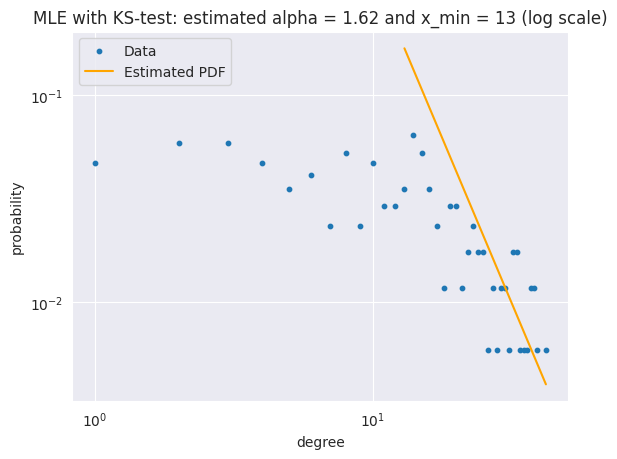

In [23]:
from scipy.stats import kstest

def mle_power_law_params(degree_sequence):
    alpha, x_min, ks_dist = 0, degree_sequence.min(), float("inf")
    for temp_x_min in np.arange(degree_sequence.min(), degree_sequence.max()):
        x = degree_sequence[degree_sequence >= temp_x_min]
        temp_alpha = 1 + len(x) / np.log(x / temp_x_min).sum()
        temp_ks_dist = kstest(x, power_law_cdf, args=(temp_alpha, temp_x_min)).statistic
        if temp_ks_dist < ks_dist:
            ks_dist, alpha, x_min = temp_ks_dist, temp_alpha, temp_x_min
    return alpha, x_min

alpha_min, x_min = mle_power_law_params(degrees)

hist, bin_edges = np.histogram(degrees, bins=100, density=True)
bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2
plt.scatter(np.arange(0, len(e_pdf)), e_pdf, s=10, label="Data")

x_space = np.linspace(x_min, max(degrees), 100)
plt.plot(x_space, power_law_pdf(x_space, alpha_min, x_min), 
         label='Estimated PDF', c='orange')

plt.legend()
plt.title('MLE with KS-test: estimated alpha = {:.2f} and x_min = {} (log scale)'.format(hat_alpha, x_min))
plt.xlabel("degree")
plt.ylabel("probability")
plt.xscale('log')
plt.yscale('log')
plt.show()

### Gorgeous network layout

Finally moving on to the beautiful visualisation of my network.
Let's play with nodes' sizes and colorize my male friends' nodes with blue color and my female friends' nodes with red color.

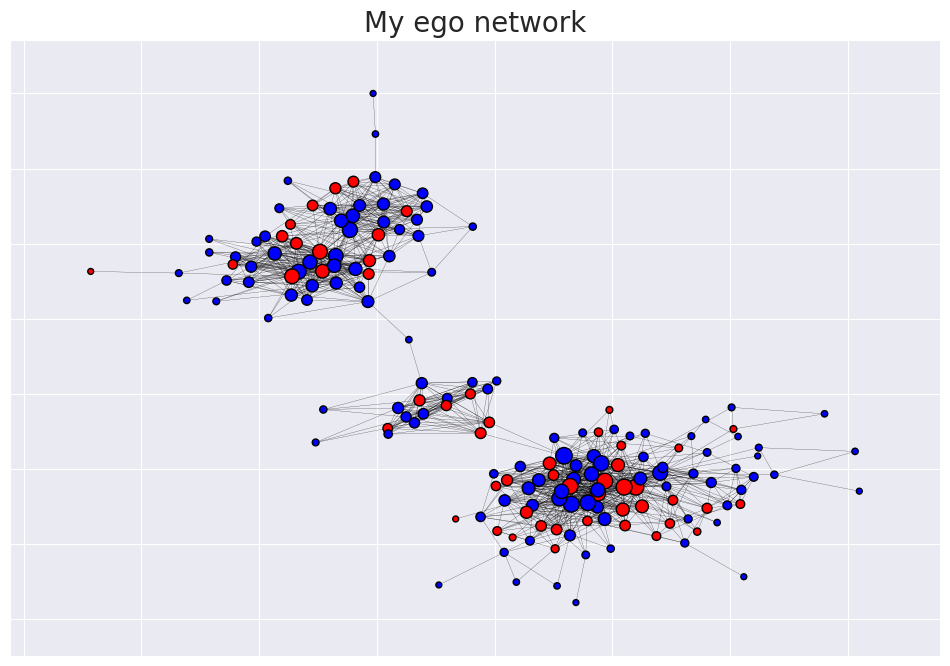

In [24]:
plt.figure(figsize=(12, 8))
plt.rcParams["figure.autolayout"] = True
nx.draw_networkx(
    G = G,
    pos = nx.kamada_kawai_layout(G),
    with_labels = False,
    node_size = [G.degree[node]*3 + 15 for node in list(G.nodes())],
    node_color = ["red" if s == 1 else "blue" for s in list(nx.get_node_attributes(G, name='sex').values())],
    width = 0.15,
    edgecolors="black"
)
plt.title("My ego network", fontsize=20)
plt.show()

We get rather beautiful vizualization but with a big number of node intersections. Let's write our own layout function and try to prevent intersections.

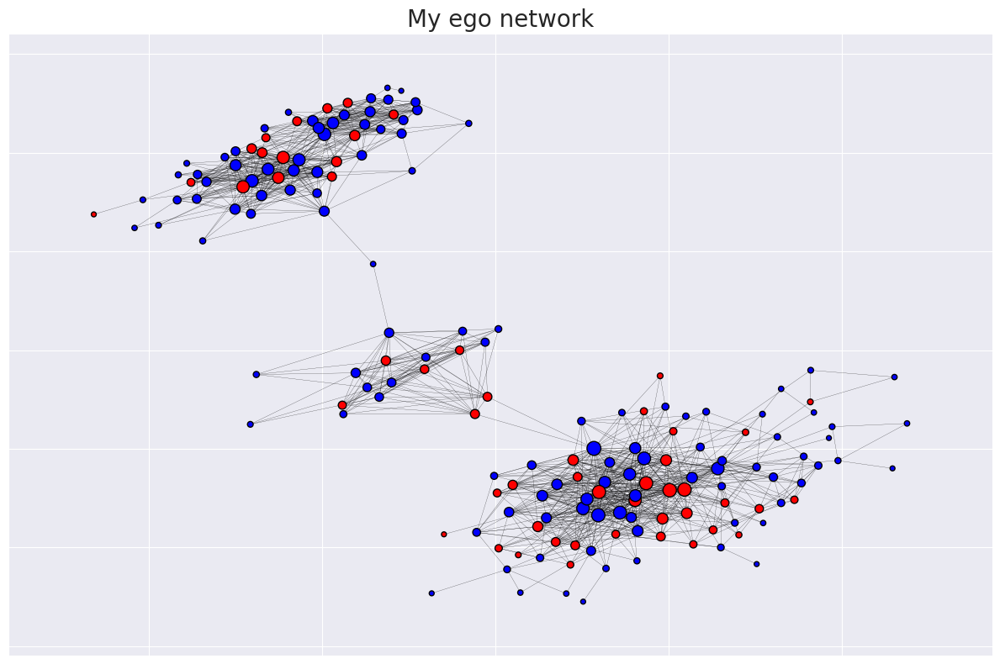

In [25]:
def new_layout(layout, sigma):
    new_layout = {}
    for k in layout.keys():
        new_layout[k] = np.exp(- (np.linalg.norm(layout[k]) ** 2) / (2 * sigma ** 2)) * layout[k] + 1
    return new_layout


plt.figure(figsize=(12, 8))
nx.draw_networkx(
    G = G,
    pos = new_layout(nx.kamada_kawai_layout(G), 0.9),
    with_labels = False,
    node_size = [G.degree[node]*3 + 15 for node in list(G.nodes())],
    node_color = ["red" if s == 1 else "blue" for s in list(nx.get_node_attributes(G, name='sex').values())],
    width = 0.15,
    edgecolors="black"
)
plt.title("My ego network", fontsize=20)
plt.show()

After a lot of experements I got the last result above and I think it is the best vizualization. BUT our title for this section is "Gorgeous network layout", so let's try some exotic layouts too.

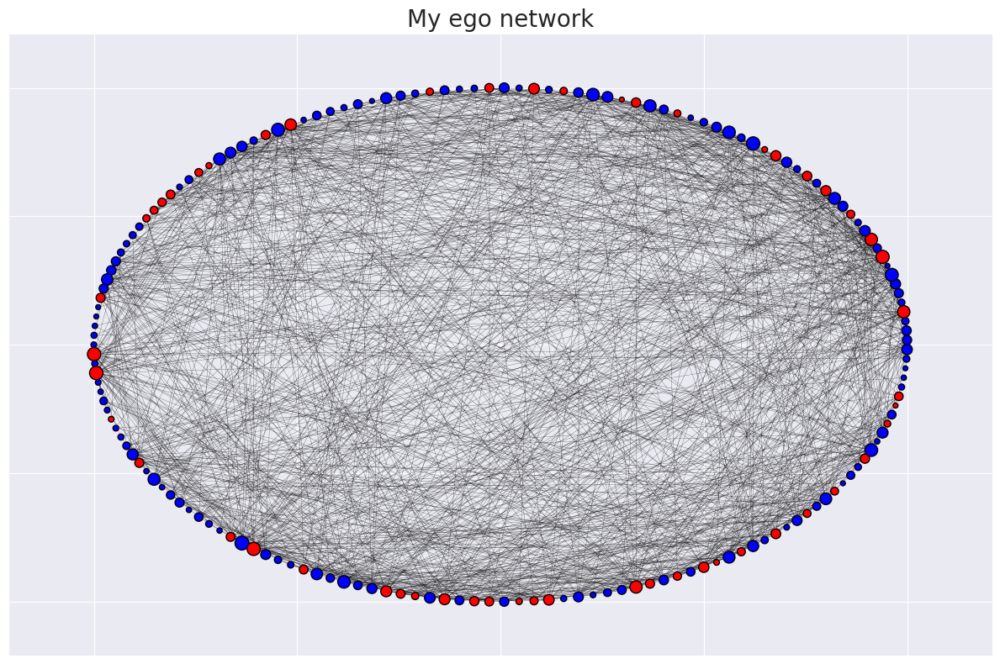

In [26]:
plt.figure(figsize=(12, 8))
nx.draw_networkx(
    G = G,
    pos = nx.shell_layout(G),
    with_labels = False,
    node_size = [G.degree[node]*3 + 15 for node in list(G.nodes())],
    node_color = ["red" if s == 1 else "blue" for s in list(nx.get_node_attributes(G, name='sex').values())],
    width = 0.15,
    edgecolors="black"
)
plt.title("My ego network", fontsize=20)
plt.show()

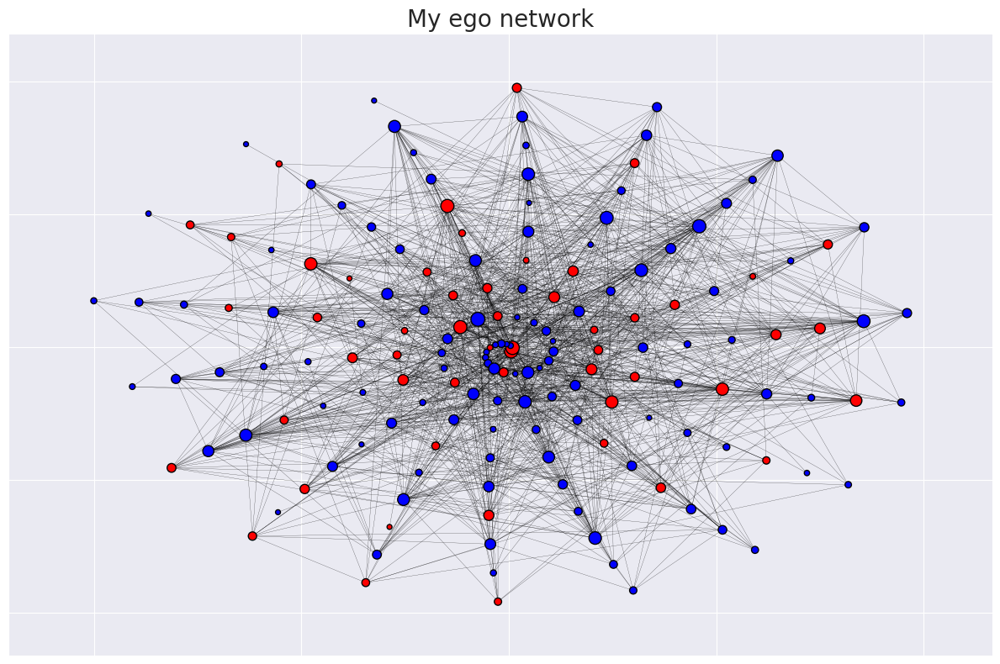

In [27]:
plt.figure(figsize=(12, 8))
nx.draw_networkx(
    G = G,
    pos = nx.spiral_layout(G),
    with_labels = False,
    node_size = [G.degree[node]*3 + 15 for node in list(G.nodes())],
    node_color = ["red" if s == 1 else "blue" for s in list(nx.get_node_attributes(G, name='sex').values())],
    width = 0.15,
    edgecolors="black"
)
plt.title("My ego network", fontsize=20)
plt.show()

The last one is extremely beautiful but very uninformative. Let's take the vizualization with custom layout as the main one.

In [28]:
layout = new_layout(nx.kamada_kawai_layout(G), 0.9)

## Structural Analysis

### The closest random graph model similar to your social network

Let's compare models **ER (Erdos-Renyi model - random model), BA (Barabasi-Albert model - preferential attachment model), WS (Watts-Strogatz model - small world model)** with my network and check real-world network properties on chosen random graph models and my network.

Let's firstly estimate our graph parameters: number of nodes, average count of edges and probability for  each pair of nodes be connected. 

In [29]:
n = int(len(G))
m = int(degrees.mean())
p = float(m / n)

In [30]:
ER_model = nx.erdos_renyi_graph(n, p, seed=59)
BA_model = nx.barabasi_albert_graph(n, m, seed=59)

Ok, we define 2 of 3 models. The last one, Watts-Strogatz model, has parameter p - the probability of rewiring each edge and we can't estimate it using our graph properties (p=0 - regular model, p=1 - random model). Let's just use a grid search teqnique to adjust this parameter based on two-sample Kolmogorov-Smirnov test and p-value.

In [31]:
from scipy.stats import ks_2samp

temp_WS_model = None
for dp in np.linspace(0, 1, 21):
    temp_WS_model = nx.watts_strogatz_graph(n, m, p=dp, seed=59)
    temp = ks_2samp(list(d for n, d in G.degree()), list(d for n, d in temp_WS_model.degree()))
    print(f"p = {round(dp, 4)} :\t stat = {temp.statistic},\t p-value = {temp.pvalue}")

p = 0.0 :	 stat = 0.5087719298245614,	 p-value = 1.634008695543195e-20
p = 0.05 :	 stat = 0.45614035087719296,	 p-value = 2.0591683817740327e-16
p = 0.1 :	 stat = 0.4093567251461988,	 p-value = 3.3333078829849794e-13
p = 0.15 :	 stat = 0.391812865497076,	 p-value = 4.217264876159817e-12
p = 0.2 :	 stat = 0.36257309941520466,	 p-value = 2.2020273518014583e-10
p = 0.25 :	 stat = 0.3508771929824561,	 p-value = 9.748795293118724e-10
p = 0.3 :	 stat = 0.3391812865497076,	 p-value = 4.0925528913037125e-09
p = 0.35 :	 stat = 0.3508771929824561,	 p-value = 9.748795293118724e-10
p = 0.4 :	 stat = 0.34502923976608185,	 p-value = 2.010689029205737e-09
p = 0.45 :	 stat = 0.3216374269005848,	 p-value = 3.189552877790718e-08
p = 0.5 :	 stat = 0.3216374269005848,	 p-value = 3.189552877790718e-08
p = 0.55 :	 stat = 0.32748538011695905,	 p-value = 1.629903673232261e-08
p = 0.6 :	 stat = 0.3216374269005848,	 p-value = 3.189552877790718e-08
p = 0.65 :	 stat = 0.3216374269005848,	 p-value = 3.189552877790

Here we see, that non of values doesn't reach p-value > 0.05, then we get that non of them is good.

Then, let's take p=0.5 - so we get non random, non regular value. 

In [32]:
WS_model = nx.watts_strogatz_graph(n, m, p=0.5, seed=59)

Now, let's compare all models.

In [33]:
graphs = [G, ER_model, BA_model, WS_model]

ct = pd.DataFrame(
    data = {
            'Order' : np.array([g.order() for g in graphs]),
            'Size' : [g.size() for g in graphs],
            'Diameter': [nx.diameter(g) for g in graphs], 
            'Radius' : [nx.radius(g) for g in graphs],
            'Global clustering coefficient' : [nx.transitivity(g) for g in graphs],
            'Avg clustering coefficient': [nx.average_clustering(g) for g in graphs],
            'Avg shortest path length': [nx.average_shortest_path_length(g) for g in graphs], 
            'KS p-val': [ks_2samp(list(d for n, d in G.degree()), list(d for n, d in g.degree())).pvalue for g in graphs]
            },
    index = ['Mine', 'Erdos-Renyi', 'Barabasi-Albert', 'Watts-Strogatz']
)

ct['Order'] = ct['Order'].astype(int).astype(str)
ct['Size'] = ct['Size'].astype(int).astype(str)
ct['Diameter'] = ct['Diameter'].astype(int).astype(str)
ct['Radius'] = ct['Radius'].astype(int).astype(str)
ct.T

,Mine,Erdos-Renyi,Barabasi-Albert,Watts-Strogatz
Order,171,171,171,171
Size,1195,1090,2054,1026
Diameter,12,4,3,4
Radius,6,3,2,3
Global clustering coefficient,0.541345,0.077933,0.222584,0.131732
Avg clustering coefficient,0.615446,0.075873,0.228692,0.136721
Avg shortest path length,4.594427,2.280358,1.907465,2.382663
KS p-val,1.0,0.000002,0.0,0.0


We can see that all random graphs are bad enough, but **the Erdos-Renyi model seems to be the best of the worst** (because of the biggest KS p-val that compare strucrures of the graphs).

### Different centralities

I am going to descrive top 3 nodes in every centrality.

In [34]:
top_nodes = 3

#### Degree centrality

**Degree centrality** depends on a number of nearest neighbours for a node. The central nodes are the nodes with highest degrees.


In [35]:
dc_top = sorted(nx.degree_centrality(G).items(), key=lambda x: x[1], reverse=True)[:top_nodes]

print(f"Top {top_nodes} nodes and their centralities:")
for i, (j, k) in enumerate(dc_top, start=1):
    print(f"{i}. {G.nodes[j]['first_name']} {G.nodes[j]['last_name']} - {round(k, 6)}")

Top 3 nodes and their centralities:
1. Егор Адамский - 0.247059
2. Марина Юрьевна - 0.229412
3. Мария Ягид - 0.223529


Here, the highest degree centralities have the following people:  
 

* **Egor Adamsky** is my friend from school. He also went to undergraduate 
school at HSE, so he connects my school friends and some classmates from HSE.
* **Marina Yurievna** and **Maria Yagid** are my school teachers, so they have connection to all my school community, and I have most of my friends from school.



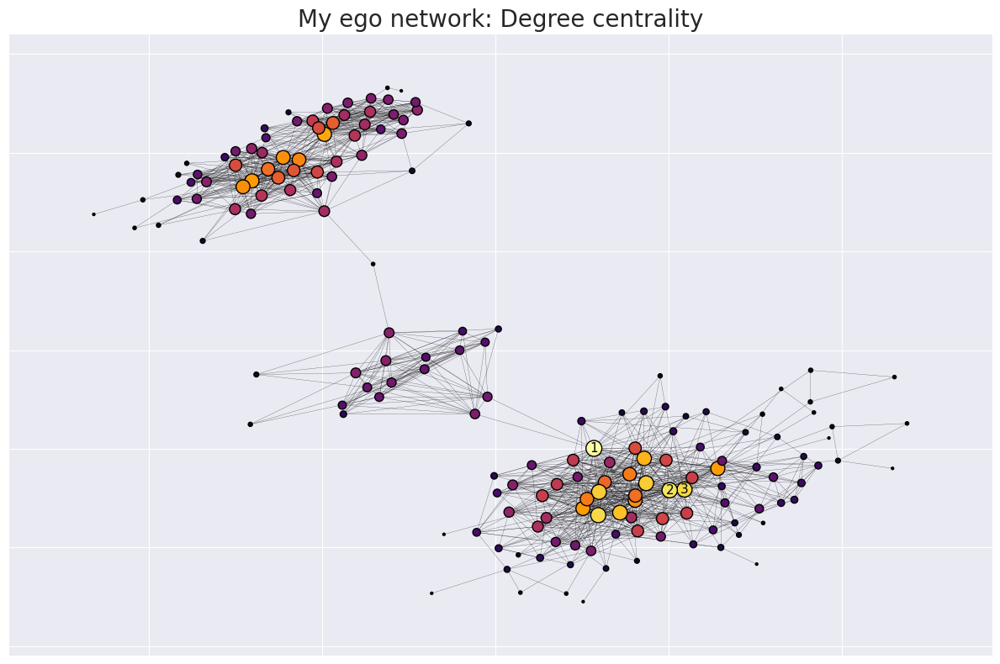

In [36]:
degree_centrality = np.array(list(nx.degree_centrality(G).values()))

plt.figure(figsize=(12, 8))
nx.draw_networkx(
    G = G,
    pos = layout,
    with_labels = False,
    node_size = degree_centrality * 750,
    node_color = degree_centrality,
    cmap=plt.cm.inferno,
    width = 0.15,
    edgecolors="black"
)
nx.draw_networkx_labels(
    G, 
    pos=layout, 
    labels={j:i for i, (j, k) in enumerate(dc_top, start=1)}, 
    font_size = 11, 
    font_color='black'
)
plt.title("My ego network: Degree centrality", fontsize=20)
plt.show()

#### Closeness centrality

**Closeness centrality** depends on how close a node to all the other nodes in network. The higher closeness centrality of a node, the closer it to all other nodes.

In [37]:
cc_top = sorted(nx.closeness_centrality(G).items(), key=lambda x: x[1], reverse=True)[:top_nodes]

print(f"Top {top_nodes} nodes and their centrality:")
for i, (j, k) in enumerate(cc_top, start=1):
    print(f"{i}. {G.nodes[j]['first_name']} {G.nodes[j]['last_name']} - {round(k, 6)}")

Top 3 nodes and their centrality:
1. Егор Адамский - 0.314233
2. Мария Кислицына - 0.305206
3. Михаил Осокин - 0.290102


Here, the highest closness centralities have the following people:  
* **Egor Adamsky** connects my school friends and some classmates from HSE.
* **Maria Kislitsyna** and **Mikhail Osokin** are my classmates from HSE, and they also have connection with my school community (Maria) and undergraduate community (Mikhail).

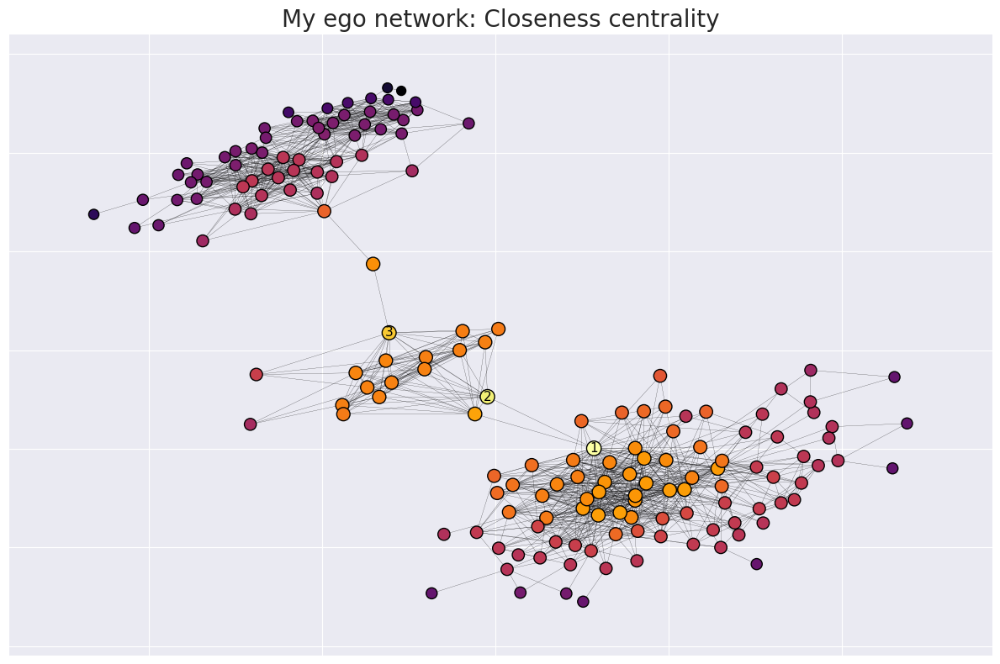

In [38]:
closeness_centrality = np.array(list(nx.closeness_centrality(G).values()))

plt.figure(figsize=(12, 8))
nx.draw_networkx(
    G = G,
    pos = layout,
    with_labels = False,
    node_size = closeness_centrality * 500,
    node_color = closeness_centrality,
    cmap=plt.cm.inferno,
    width = 0.15,
    edgecolors="black"
)
nx.draw_networkx_labels(
    G, 
    pos=layout, 
    labels={j:i for i, (j, k) in enumerate(cc_top, start=1)}, 
    font_size = 11, 
    font_color='black'
)
plt.title("My ego network: Closeness centrality", fontsize=20)
plt.show()

#### Betweenness centrality

**Betweenness centrality** depends on number of shortest paths going through the node. The higher betweenness centrality of a node, the more it goes through the shortest paths.

In [39]:
bc_top = sorted(nx.betweenness_centrality(G).items(), key=lambda x: x[1], reverse=True)[:top_nodes]

print(f"Top {top_nodes} nodes and their centrality:")
for i, (j, k) in enumerate(bc_top, start=1):
    print(f"{i}. {G.nodes[j]['first_name']} {G.nodes[j]['last_name']} - {round(k, 6)}")

Top 3 nodes and their centrality:
1. Егор Адамский - 0.518841
2. Михаил Осокин - 0.46427
3. Алексей Рябыкин - 0.45945


Here, the highest betweenness centralities have the following people:  
* **Egor Adamsky** (again!) connects my school friends and some classmates from HSE.
* **Mikhail Osokin** and **Alexei Ryabykin** are my classmates from HSE, and they both have connection with my undergraduate community.

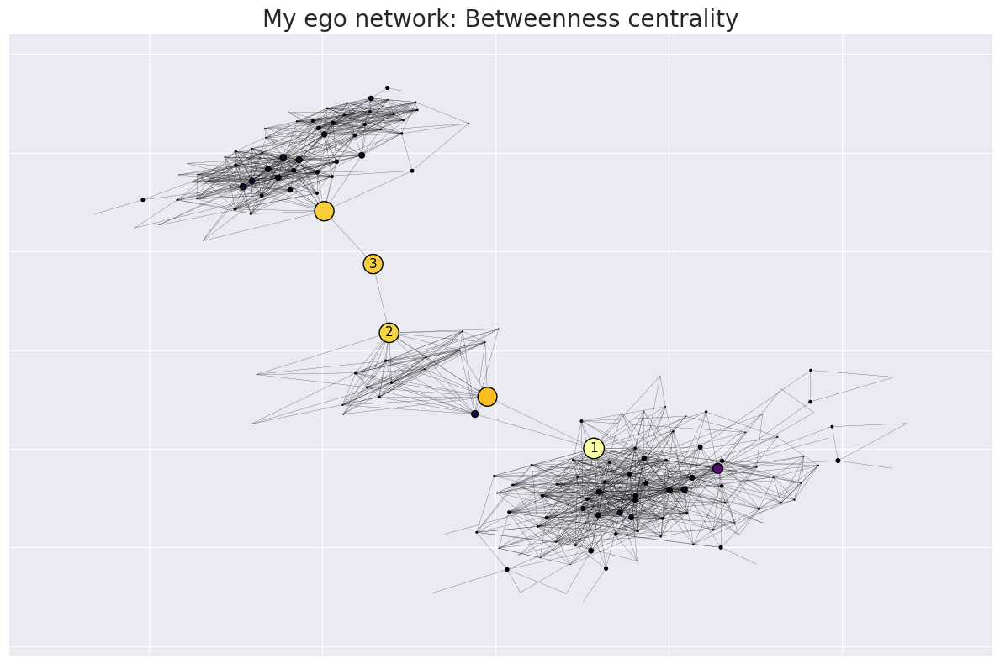

In [40]:
betweenness_centrality = np.array(list(nx.betweenness_centrality(G).values()))

plt.figure(figsize=(12, 8))
nx.draw_networkx(
    G = G,
    pos = layout,
    with_labels = False,
    node_size = betweenness_centrality * 600,
    node_color = betweenness_centrality,
    cmap=plt.cm.inferno,
    width = 0.15,
    edgecolors="black"
)
nx.draw_networkx_labels(
    G, 
    pos=layout, 
    labels={j:i for i, (j, k) in enumerate(bc_top, start=1)}, 
    font_size = 11, 
    font_color='black'
)
plt.title("My ego network: Betweenness centrality", fontsize=20)
plt.show()

Here we see 5 big nodes, but we only consider the top 3 ...

#### Katz centrality

**Katz centrality** is based on the number of walks (a path that can contain repeated nodes) passing through a node.

Let's firstly estimate attenuation factor $\beta$ that have restriction
$$\beta < \frac{1}{\lambda}$$
where $\lambda$ is a largest eigenvalue of a matrix $A$.

In [41]:
beta = 0.01
w, v = np.linalg.eig(nx.to_numpy_array(G))
assert beta < 1 / max(w)

Ok, we find the good parameter.

In [42]:
kc_top = sorted(nx.katz_centrality(G, alpha=beta).items(), key=lambda x: x[1], reverse=True)[:top_nodes]

print(f"Top {top_nodes} nodes and their centrality:")
for i, (j, k) in enumerate(kc_top, start=1):
    print(f"{i}. {G.nodes[j]['first_name']} {G.nodes[j]['last_name']} - {round(k, 6)}")

Top 3 nodes and their centrality:
1. Егор Адамский - 0.098971
2. Марина Юрьевна - 0.096987
3. Петр Казанов - 0.096412


Here, the highest Katz centralities have the following people:  
* Again **Egor Adamsky** and **Marina Yurievna**.
* **Peter Kazanov** is a classmate of mine. Peter was quite well known in the school, as he was the school's student president.

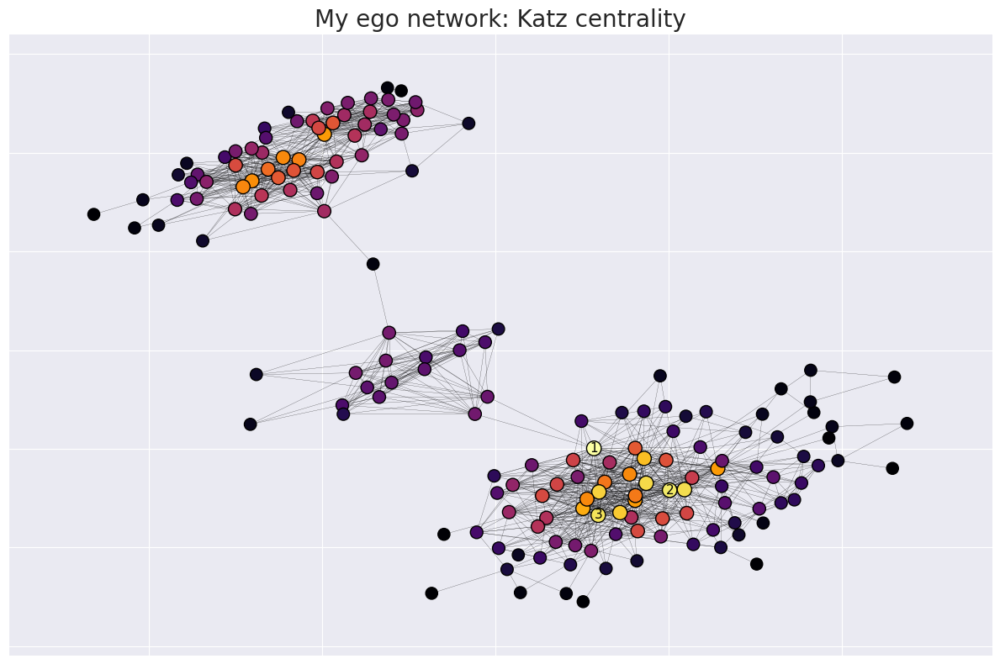

In [43]:
katz_centrality = np.array(list(nx.katz_centrality(G, alpha=beta).values()))

plt.figure(figsize=(12, 8))
nx.draw_networkx(
    G = G,
    pos = layout,
    with_labels = False,
    node_size = katz_centrality * 1600,
    node_color = katz_centrality,
    cmap=plt.cm.inferno,
    width = 0.15,
    edgecolors="black"
)
nx.draw_networkx_labels(
    G, 
    pos=layout, 
    labels={j:i for i, (j, k) in enumerate(kc_top, start=1)}, 
    font_size = 11, 
    font_color='black'
)
plt.title("My ego network: Katz centrality", fontsize=20)
plt.show()

#### Eigenvector centrality

**Eigenvector centrality** computes the centrality for a node based on the centrality of its neighbors. 

In [44]:
ec_top = sorted(nx.eigenvector_centrality(G).items(), key=lambda x: x[1], reverse=True)[:top_nodes]

print(f"Top {top_nodes} nodes and their centrality:")
for i, (j, k) in enumerate(ec_top, start=1):
    print(f"{i}. {G.nodes[j]['first_name']} {G.nodes[j]['last_name']} - {round(k, 6)}")

Top 3 nodes and their centrality:
1. Петр Казанов - 0.222897
2. Людмила Сибрина - 0.220709
3. Марина Юрьевна - 0.216919


Here, the highest eigenvector centralities have the following people:  
* Again **Peter Kazanov*** and **Marina Yurievna**.
* **Lyudmila Sibrina** is my classmate, and she was very popular at school, as she was an actress and the soul of the company.

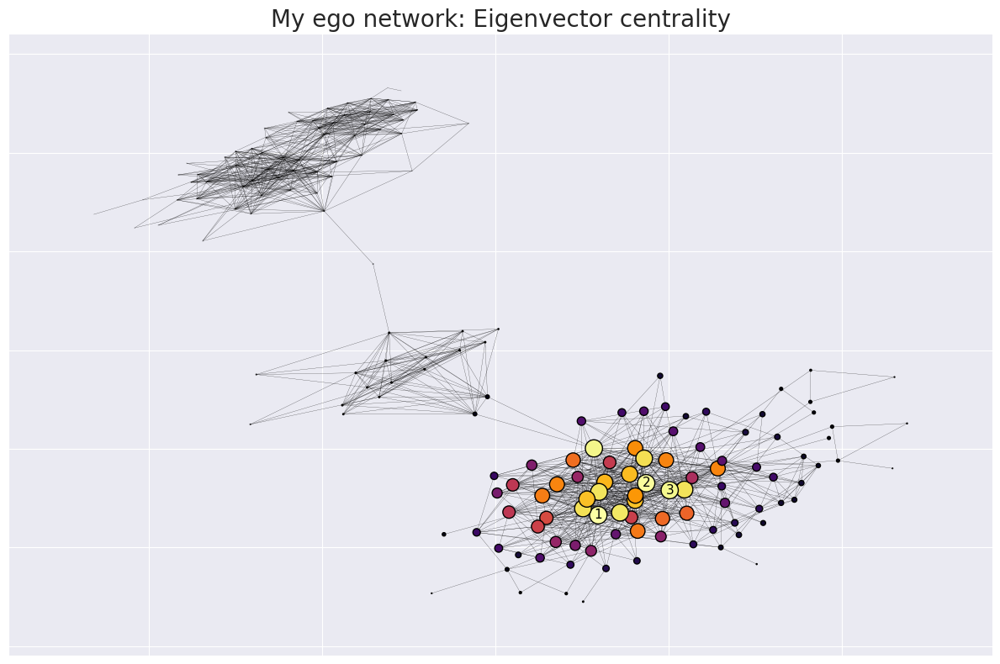

In [45]:
eigenvector_centrality = np.array(list(nx.eigenvector_centrality(G).values()))

plt.figure(figsize=(12, 8))
nx.draw_networkx(
    G = G,
    pos = layout,
    with_labels = False,
    node_size = eigenvector_centrality * 1000,
    node_color = eigenvector_centrality,
    cmap=plt.cm.inferno,
    width = 0.15,
    edgecolors="black"
)
nx.draw_networkx_labels(
    G, 
    pos=layout, 
    labels={j:i for i, (j, k) in enumerate(ec_top, start=1)}, 
    font_size = 11, 
    font_color='black'
)
plt.title("My ego network: Eigenvector centrality", fontsize=20)
plt.show()

### PageRank

**PageRank** computes a ranking of the nodes in the graph G based on the structure of the incoming links.

As a damping parameter for PageRank, I am going to take classical 0.85.

In [46]:
pr_top = sorted(nx.pagerank(G).items(), key=lambda x: x[1], reverse=True)[:top_nodes]

print(f"Top {top_nodes} nodes and their centrality:")
for i, (j, k) in enumerate(pr_top, start=1):
    print(f"{i}. {G.nodes[j]['first_name']} {G.nodes[j]['last_name']} - {round(k, 6)}")

Top 3 nodes and their centrality:
1. Али Алиев - 0.016656
2. Егор Адамский - 0.015797
3. Марина Юрьевна - 0.014891


Here, the highest pageranks have the following people:  
* Again **Egor Adamsky** and **Marina Yurievna**.
* **Ali Aliev** is my brother and he knows a lot pf my school friends.

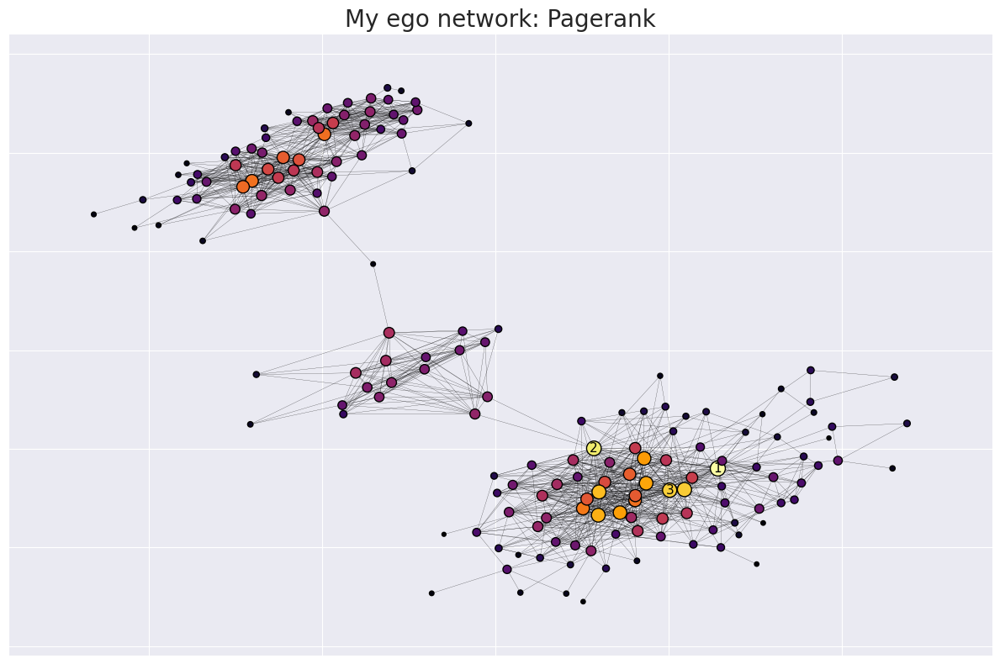

In [47]:
pagerank = np.array(list(nx.pagerank(G).values()))

plt.figure(figsize=(12, 8))
nx.draw_networkx(
    G = G,
    pos = layout,
    with_labels = False,
    node_size = pagerank * 10000,
    node_color = pagerank,
    cmap=plt.cm.inferno,
    width = 0.15,
    edgecolors="black"
)
a = nx.draw_networkx_labels(
    G, 
    pos=layout, 
    labels={j:i for i, (j, k) in enumerate(pr_top, start=1)}, 
    font_size = 11, 
    font_color='black'
)
plt.title("My ego network: Pagerank", fontsize=20)
plt.show()

### Correlation comparison of centralities

Now, let's look at the **Pearson correlation of centralities**.

In [48]:
all_centralities = {
    "Degree centrality" : degree_centrality,
    "Closeness centrality" : closeness_centrality, 
    "Betweenness centrality" : betweenness_centrality,
    "Katz centrality" : katz_centrality,
    "Eigenvector centrality" : eigenvector_centrality,
    "Pagerank" : pagerank
}

all_centralities = pd.DataFrame(all_centralities)
corr_matrix = all_centralities.corr().round(6)
corr_matrix

,Degree centrality,Closeness centrality,Betweenness centrality,Katz centrality,Eigenvector centrality,Pagerank
Degree centrality,1.000000,0.423205,0.191694,0.997814,0.622588,0.973878
Closeness centrality,0.423205,1.000000,0.352416,0.429463,0.631487,0.498917
Betweenness centrality,0.191694,0.352416,1.000000,0.177386,0.075267,0.235470
Katz centrality,0.997814,0.429463,0.177386,1.000000,0.658273,0.966435
Eigenvector centrality,0.622588,0.631487,0.075267,0.658273,1.000000,0.648165
Pagerank,0.973878,0.498917,0.235470,0.966435,0.648165,1.000000


Let's see a picture from this table.

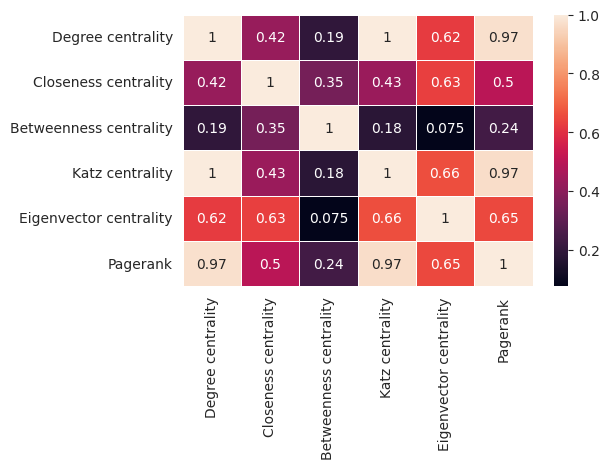

In [49]:
sns.heatmap(corr_matrix, annot=True, linewidth=0.5)
plt.show()

We can clearly see here that
* **Degree centrality** correlates very strongly with **Katz centrality** and **Pagerank**, and correlates with **Eigenvector centrality**.
* **Closeness centrality** correlates with **Eigenvector centrality** and **Pagerank**.
* **Katz centrality** correlates very strongly with **Degree centrality** and **Pagerank**, and correlates with **Eigenvector centrality**.
* **Eigenvector centrality** correlates with **Degree centrality**, **Closeness centrality**, **Katz centrality** and **Pagerank**.
* **Pagerank** correlates very strongly with **Katz centrality** and **Degree centrality**, and correlates with **Eigenvector centrality** and **Closeness centrality**.




### Assortative mixing by node attributes and node degree

Network mixing patterns
* **Assortative mixing**, ”like links with like”, attributed of
connected nodes tend to be more similar than if there were no
such edge;
* **Disassortative mixing**, ”like links with dislike”, attributed of
connected nodes tend to be less similar than if there were no
such edge.

We can obtain the following values:
* $r=1$ - assortativity;
* $r=-1$ - disassortativity;
* $r=0$ - non-assortativity.



Let's firstly check **node attributes assortativity**. I have only one non-unique attribute: sex of my friend.

In [50]:
print(f"Node attributes assortativity = {round(nx.attribute_assortativity_coefficient(G, 'sex'),6)}")

Node attributes assortativity = 0.106611


So, we get something near 0, thus our only non-unique **node attribute "sex" is non-assortative**.

Secondly, let's move on to **node degree assortativity**.

In [51]:
print(f"Node degree assortativity = {round(nx.degree_assortativity_coefficient(G))}")

Node degree assortativity = 0


So, we also get **non-assortativity for node degree**.

### Node structural equivalence/similarity

Two vertices are **structurally equivalent** if their respective sets of in-neighbors and out-neighbors are the same (in our case it means that two friends has the same set of their friends).

In [52]:
node_list = list(G.nodes())
A = nx.to_numpy_array(G)
A_df =pd.DataFrame(A, index=node_list, columns=node_list)

duplicates = A_df[A_df.duplicated(keep=False)]
for ind in duplicates.index:
    print(G.nodes[ind]['first_name'], G.nodes[ind]['last_name'])

Михаил Супрунец
Феликс Торосян


So, we have two nodes in my graph that are structurally equivalent.

The definition of structural equivalence is very strict, so let's move on to structural similarity.

Two nodes are **similar** to each other if they share many neighbors. 

We can measure similarity values using these formulas
* Pearson correlation $$r(i,j) = \frac{\text{cov}(A_i, A_j)}{\sigma_i \sigma_j}$$
* Jaccard similarity $$J(i, j) = \frac{|\mathcal{N}(i) \cap \mathcal{N}(j)|}{|\mathcal{N}(i) \cup \mathcal{N}(j)|}$$
* Cosine similarity $$\cos(i,j) = \frac{A_i^\top A_j}{|A_i||A_j|}$$

In [53]:
def sim_values(A, i, j):
    cos = (A[i] * A[j]).sum() / np.sqrt(A[i].sum()) / np.sqrt(A[j].sum())
    jac = (A[i] * A[j]).sum() / ((A[i] + A[j]) > 0).sum()
    cov = np.cov(A[i], A[j])
    pearson = cov[0, 1] / np.sqrt(cov[0, 0] * cov[1, 1])
    return (pearson, jac, cos)

A = nx.to_numpy_array(G)
cos_sim = np.zeros(A.shape)
pearson_sim = np.zeros(A.shape)
jaccard_sim = np.zeros(A.shape)
for i in range(len(G)):
    for j in range(i, (len(G))):
        pval, jval, cval = sim_values(A, i, j)
        pearson_sim[i, j] = pval
        pearson_sim[j, i] = pval
        jaccard_sim[i, j] = jval
        jaccard_sim[j, i] = jval
        cos_sim[i, j] = cval
        cos_sim[j, i] = cval

Without special preprocess procedures an adjacency matrix can look very noisy and hide network's structure. We can use Reverse Cuthill-McKee to solve it.

In [54]:
from scipy.sparse.csgraph import reverse_cuthill_mckee

order = reverse_cuthill_mckee(nx.adjacency_matrix(G))

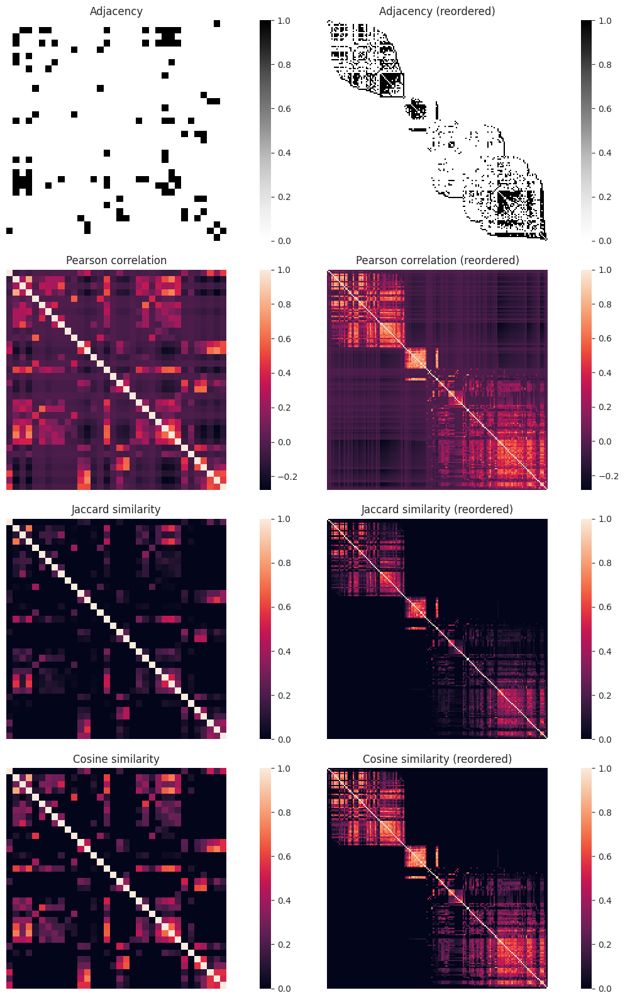

In [55]:
fig = plt.figure(figsize=(16, 16))
plt.subplots_adjust(hspace=0.4, wspace=0.4)

cases = [[1, A, plt.cm.Greys, 'Adjacency', range(34)],
         [2, A, plt.cm.Greys, 'Adjacency (reordered)', order],
         [3, pearson_sim, None, 'Pearson correlation', range(34)], 
         [4, pearson_sim, None, 'Pearson correlation (reordered)', order], 
         [5, jaccard_sim, None, 'Jaccard similarity', range(34)], 
         [6, jaccard_sim, None, 'Jaccard similarity (reordered)', order], 
         [7, cos_sim, None, 'Cosine similarity', range(34)], 
         [8, cos_sim, None, 'Cosine similarity (reordered)', order]]

for i, matrix, cmap, t, o in cases:
    plt.subplot(4, 2, i)
    hmap = sns.heatmap(
        matrix[np.ix_(o, o)],
        cmap=cmap,
        square=True,
        yticklabels=False,
        xticklabels=False)
    hmap.tick_params(left=False, bottom=False)
    plt.title(t)

In last three rows we can clearly find 3 group of similar nodes. I believe it refers to three supposed community:
* school friends - square in the bottom right corner;
* friends from MIREA - square in the top left corner;
* friends from HSE - square in hte middle.

## Community Detection



### Clique search, k-cores visualization

#### Max cliques

A **clique** is a subset of vertices of a graph such that every two distinct vertices in the clique are adjacent.

Let's find max cliques in my graph.

In [56]:
max_cliques = sorted(nx.find_cliques(G), key=len, reverse=True)
max_clique_size = len(max_cliques[0])
max_clique_count = len([c for c in max_cliques if len(c) == len(max_cliques[0])])

print('Size of max clique =', max_clique_size)
print('Number of max cliques =', max_clique_count)

Size of max clique = 13
Number of max cliques = 6


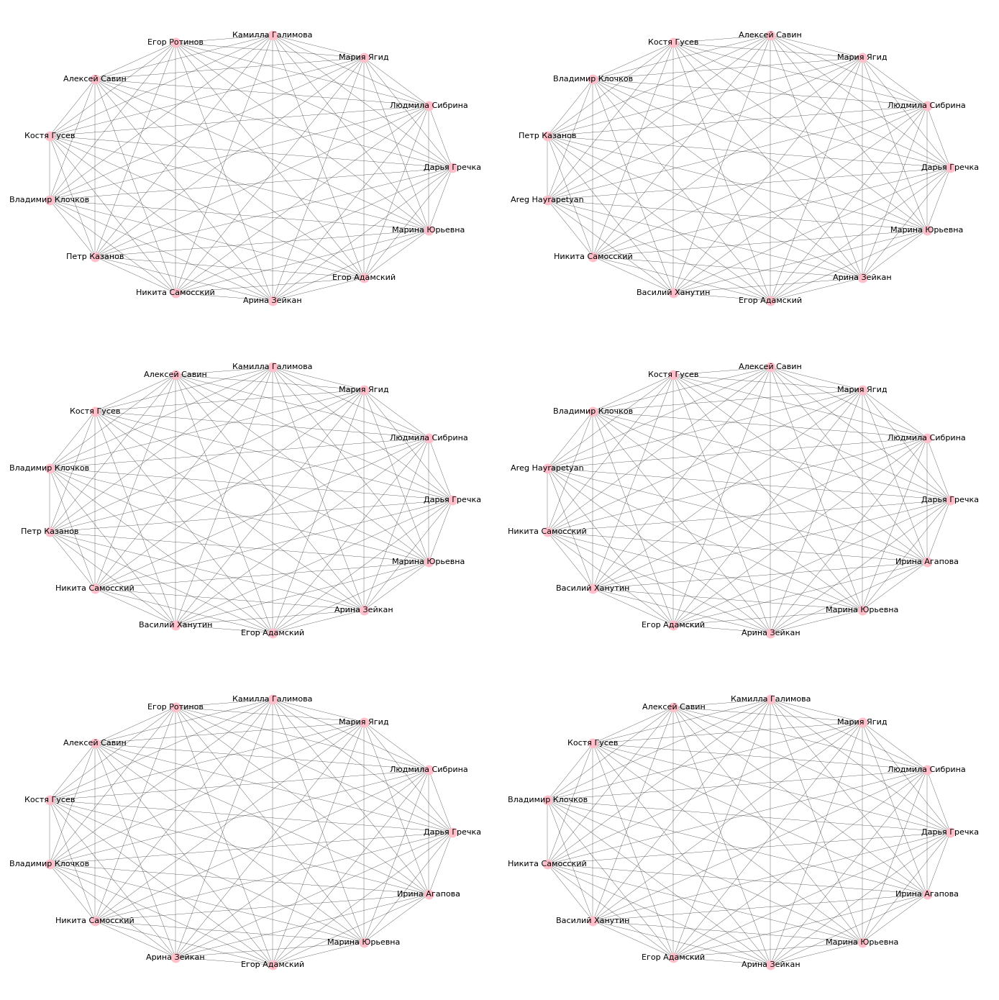

In [57]:
fig, axes = plt.subplots(int(max_clique_count/2), 2, figsize=(14,14))
ax = axes.ravel()

for i, c in enumerate(max_cliques[:max_clique_count]):
  temp_clique = G.subgraph(c).copy()
  names_dict = {n:temp_clique.nodes()[n]['first_name'] + " " + temp_clique.nodes()[n]['last_name'] for n in temp_clique}
  nx.draw_kamada_kawai(
      temp_clique, 
      ax=ax[i],
      node_size=80,
      node_color='pink',
      labels=names_dict, 
      font_size=8,
      width=0.2
    )

All this clique consist of my school friends.

####  k-cores visualization

A **k-core** is a maximal subgraph that contains nodes of degree k or more.

**K-core decomposition** is a procedure for recursively removing nodes with a degree less than k.

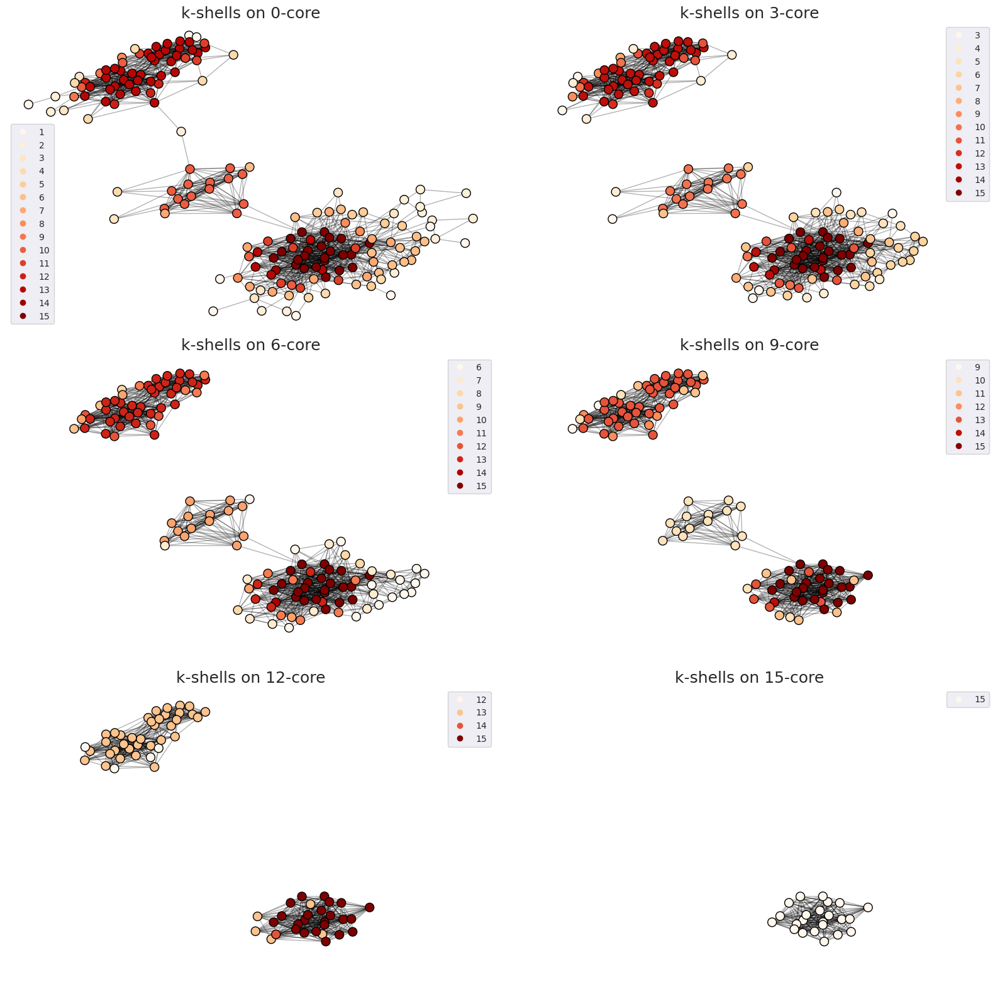

In [58]:
def k_core_decompose(G):
    return np.array(list(nx.core_number(G).values()))

plt.figure(figsize=(16, 16))

x_max, y_max = np.array(list(layout.values())).max(axis=0)
x_min, y_min = np.array(list(layout.values())).min(axis=0)

for i in range(6):
    plt.subplot(3, 2, i+1)
    subG = nx.k_core(G, i*3)
    nodes = nx.draw_networkx_nodes(
        subG, 
        layout,
        cmap=plt.cm.OrRd,
        node_color=k_core_decompose(subG), 
        node_size=100, 
        edgecolors='black'
    )
    nx.draw_networkx_edges(
        subG, 
        layout,
        alpha=0.3,
        width=1, 
        edge_color='black'
    )
    eps = (x_max - x_min) * 0.05
    plt.xlim(x_min-eps, x_max+eps)
    plt.ylim(y_min-eps, y_max+eps)
    plt.legend(*nodes.legend_elements())
    plt.axis('off')
    plt.title('k-shells on {}-core'.format(i*3), fontdict = {'fontsize' : 18})

### Community detection

Here, I am going to apply several community detection techniques. Let's see what comes out.

Let's code our graph nodes names to pass them to adjacency matrix.

In [59]:
name_forw = {}
name_back = {}

for i, j in enumerate(G.nodes):
    name_forw[j] = i
    name_back[i] = j

In [60]:
def expected_edges(A, m):
    return A.sum(axis=1, keepdims=True) * A.sum(axis=0, keepdims=True) / 2 / m

def kronecker(A, communities):
    res = np.zeros_like(A)
    for comm in communities:
      for i in comm:
        for j in comm:
          res[name_forw[i], name_forw[j]] = 1
    return res

def modularity(A, communities):
    m = A.sum() / 2
    res = (A - expected_edges(A, m)) * kronecker(A, communities)
    return res.sum() / 2 / m

#### Girvan-Newman algorithm

Firstly, let's apply Girvan-Newman algorithm with edge betweenness. The simple idea is to cut edges with highest betweenness (bridges) forming connected components.

For this algorithm we need to know the number of communities. I can assume from the constructed graph images that there are 3 communities, but let's get the number using the modularity metric.

In [61]:
def edge_betw_modularity(G, n):
    res = []
    A = nx.to_numpy_array(G)
    com_gen = nx.community.girvan_newman(G)
    for i in range(n):
      communities = next(com_gen)
      res.append(modularity(A, communities))
    return np.array(res)

A = nx.to_numpy_array(G)
m = G.number_of_edges()
ee = expected_edges(A, m)

n_iterations = 20
mod_val = edge_betw_modularity(G, n_iterations)

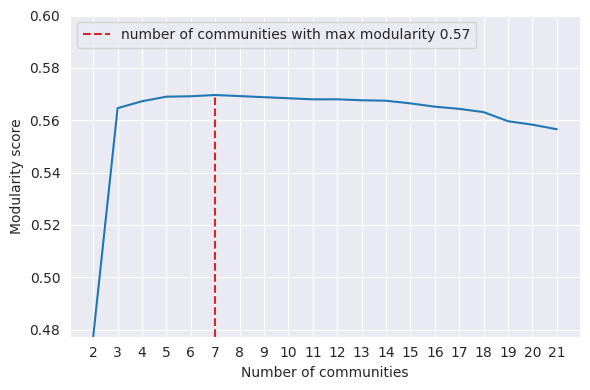

In [62]:
plt.figure(figsize=(6, 4))
plt.plot(np.arange(n_iterations)+2, mod_val)
best_n = np.argmax(mod_val) + 2
label = 'number of communities with max modularity {:.2f}'.format(max(mod_val))
plt.plot(
    [best_n, best_n], [min(mod_val), max(mod_val)], 
    linestyle='--', c='tab:red', 
    label=label
)
plt.ylabel('Modularity score')
plt.xlabel('Number of communities')
plt.legend(loc='upper left')
plt.xticks(np.arange(n_iterations)+2)
plt.ylim((mod_val.min(), 0.6))
plt.show()

So, here we see 7 communities, but 3 communities alse has similar modularity.

In [63]:
def remove_bridges(G):
    n_cc = nx.number_connected_components(G)
    while n_cc == nx.number_connected_components(G):
        edge_betw = nx.edge_betweenness_centrality(G)
        G.remove_edge(*max(edge_betw, key=edge_betw.get))
    
def girvan_newman(G, n):
    labels = np.zeros((n, len(G)))
    _G = G.copy()
    for division in range(n):
        remove_bridges(_G)
        for i, cc in enumerate(nx.connected_components(_G)):
            temp_cc = list([name_forw[i] for i in cc])
            labels[division, temp_cc] = i
    return labels

labels = girvan_newman(G, best_n)

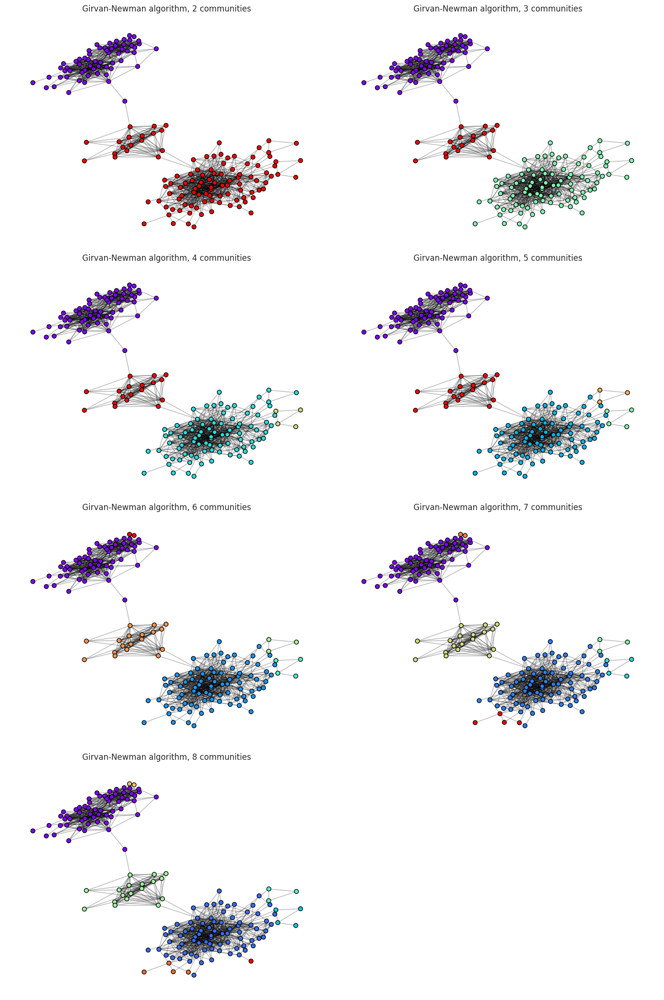

In [64]:
plt.figure(figsize=(7*2, 7*3))
for i in range(labels.shape[0]):
    plt.subplot(4, 2, i+1)
    nx.draw_networkx_nodes(
        G, 
        layout,
        cmap=plt.cm.rainbow,
        node_color=labels[i], 
        node_size=40, 
        edgecolors='black'
    )
    nx.draw_networkx_edges(G, layout, alpha=0.3)
    plt.title('Girvan-Newman algorithm, {} communities'.format(i+2))
    plt.axis('off')

Let's stop on 3 and 7 counts of communities.

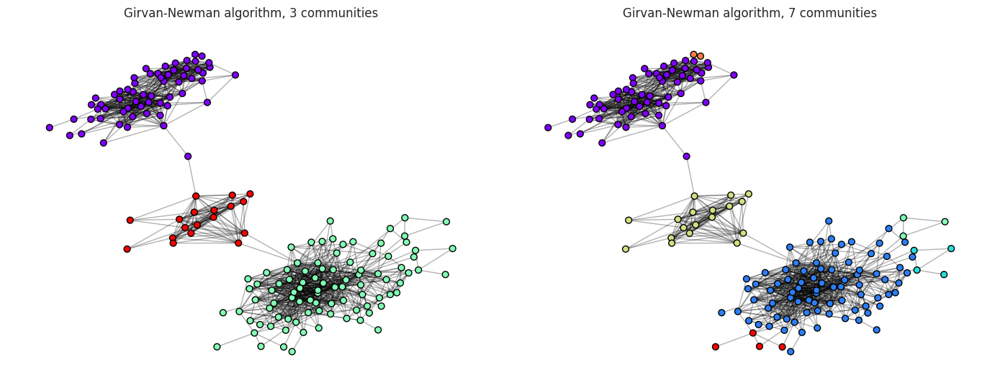

In [65]:
plt.figure(figsize=(7*2, 7*3))
for i, j in enumerate([1, 5]):
    plt.subplot(4, 2, i+1)
    nx.draw_networkx_nodes(
        G, 
        layout,
        cmap=plt.cm.rainbow,
        node_color=labels[j], 
        node_size=40, 
        edgecolors='black'
    )
    nx.draw_networkx_edges(G, layout, alpha=0.3)
    plt.title('Girvan-Newman algorithm, {} communities'.format(j+2))
    plt.axis('off')

I don't know what to say about 7 communities, but for 3 communities:
* green - school friends;
* red - HSE friends;
* purple - MIREA friends.

#### Agglomerative clustering

**Agglomerative clustering** is an iterative procedure that unions similar clusters using a similarity matrix.

In [66]:
def simrank_distance(g):
    sim_dict = nx.simrank_similarity(g)
    n = len(sim_dict)
    res = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            res[i, j] = res[j, i] = 1 - sim_dict[name_back[i]][name_back[j]]
    return res

In [67]:
distance = simrank_distance(G)

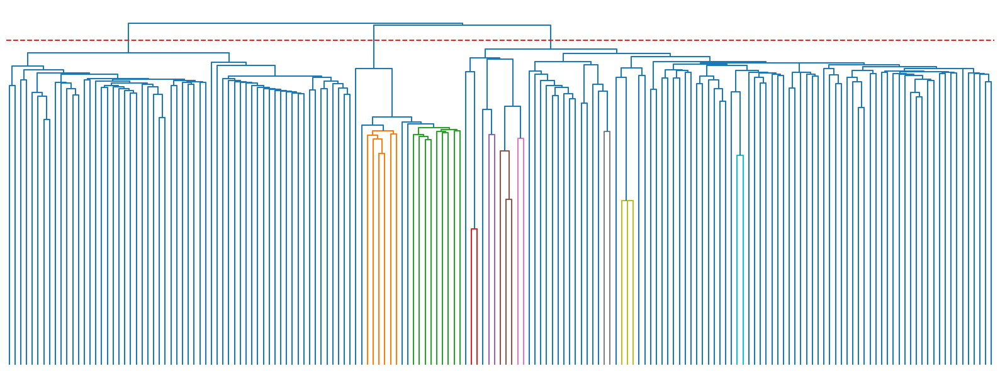

In [68]:
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import squareform

plt.figure(figsize=(16, 6))
linked = linkage(squareform(distance), 'complete')
dendrogram(linked, labels=list(G.nodes), 
           leaf_font_size=12)
plt.plot([0, 5000], [0.95, 0.95], linestyle='--', c='tab:red')
plt.axis('off')
plt.show()

In [69]:
from sklearn.cluster import AgglomerativeClustering

def agglomerative_clustering(distance, max_distance):
    clustering = AgglomerativeClustering(
        n_clusters=None, 
        affinity="precomputed", 
        linkage='complete', 
        distance_threshold=max_distance).fit(distance)
    return clustering.labels_

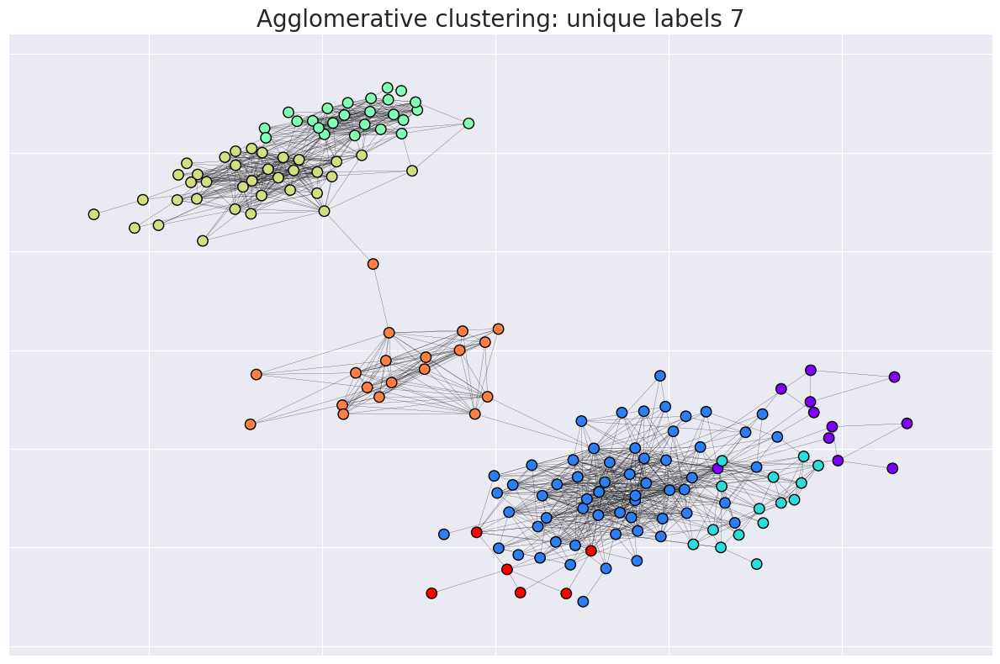

In [70]:
labels = agglomerative_clustering(distance, 0.9)

plt.figure(figsize=(12, 8))
nx.draw_networkx(
    G = G,
    pos = layout,
    with_labels = False,
    cmap=plt.cm.rainbow,
    node_size = 80,
    node_color = labels,
    width = 0.15,
    edgecolors="black"
)
plt.title(f'Agglomerative clustering: unique labels {len(np.unique(labels))}', fontdict = {'fontsize' : 20})
plt.show()

7 communities doesn't look good in this graph. Let's take 3 of them.

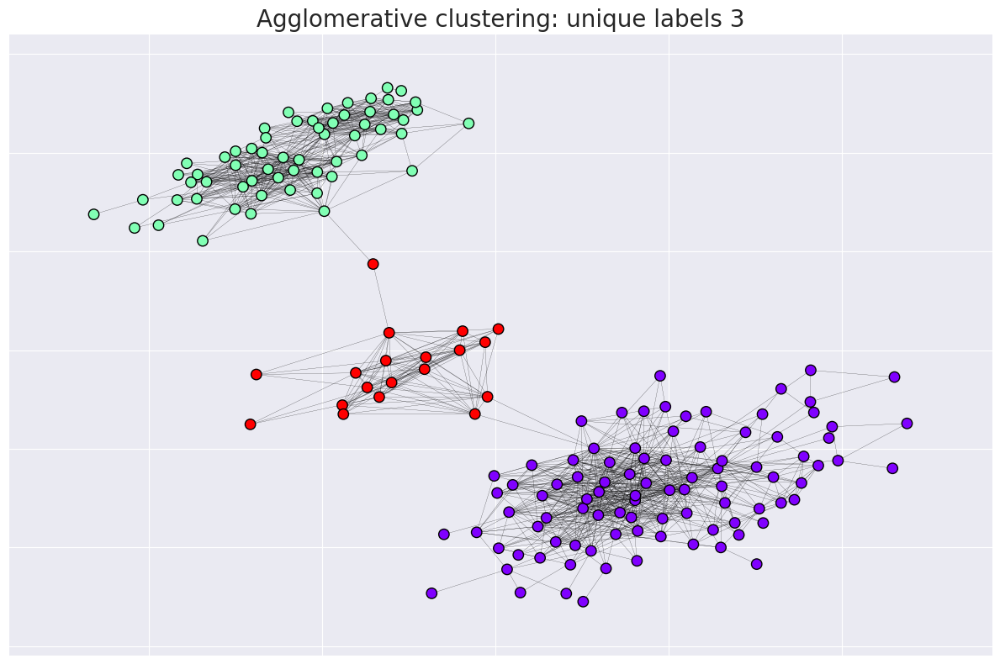

In [71]:
labels = agglomerative_clustering(distance, 0.97)

plt.figure(figsize=(12, 8))
nx.draw_networkx(
    G = G,
    pos = layout,
    with_labels = False,
    cmap=plt.cm.rainbow,
    node_size = 80,
    node_color = labels,
    width = 0.15,
    edgecolors="black"
)
plt.title(f'Agglomerative clustering: unique labels {len(np.unique(labels))}', fontdict = {'fontsize' : 20})
plt.show()

Now, we get the same interpretable clusters as before.

### Spectral clustering

**Spectral clustering**  is a very powerful algorithm for community detection that minimize graph cuts. It is based on Laplacian eigenvectors

In [72]:
from sklearn.cluster import KMeans
import scipy

def norm_laplacian(A):
    D = np.diag(A.sum(axis=1))
    tempD = scipy.linalg.fractional_matrix_power(D, -0.5)
    return tempD @ (D - A) @ tempD

def spectral_embedding(L, n_components):
    vals, vecs = np.linalg.eigh(L)
    return np.array([vecs[:, i] for i in range(1, n_components+1)]).T

def spectral_clustering(G, n_clusters, n_components):
    A = nx.to_numpy_array(G)
    L = norm_laplacian(A)
    embedding = spectral_embedding(L, n_components)
    kmeans = KMeans(n_clusters=n_clusters)
    kmeans.fit(embedding)
    return kmeans.labels_

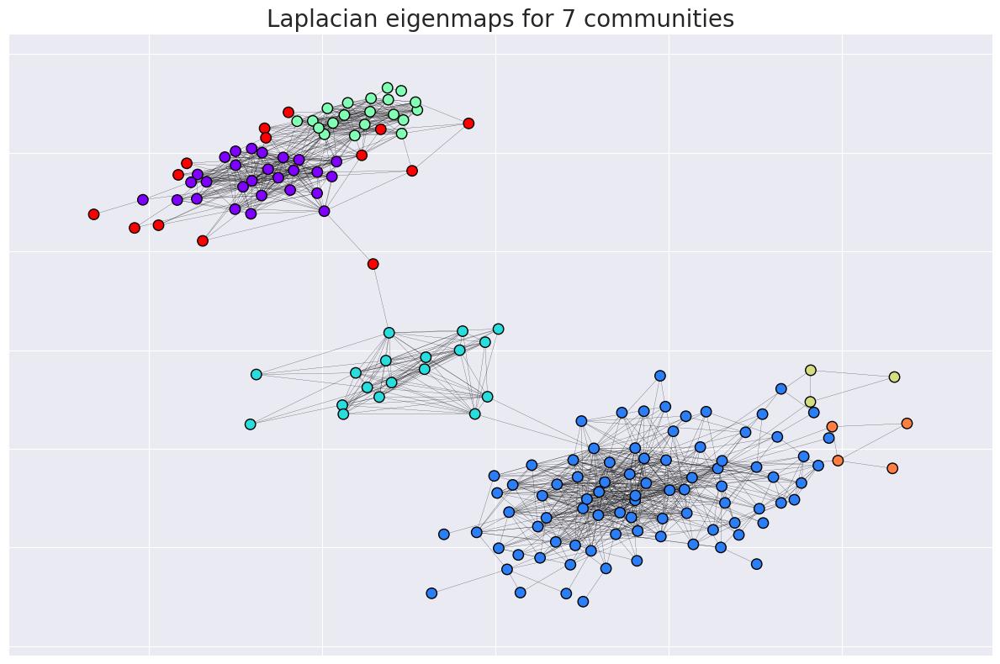

In [73]:
labels = spectral_clustering(G, 7, 5)

plt.figure(figsize=(12, 8))
nx.draw_networkx(
    G = G,
    pos = layout,
    with_labels = False,
    cmap=plt.cm.rainbow,
    node_size = 80,
    node_color = labels,
    width = 0.15,
    edgecolors="black"
)
plt.title("Laplacian eigenmaps for 7 communities", fontsize=20)
plt.show()

We get bad picture for 7 communities. Let's try for 3.

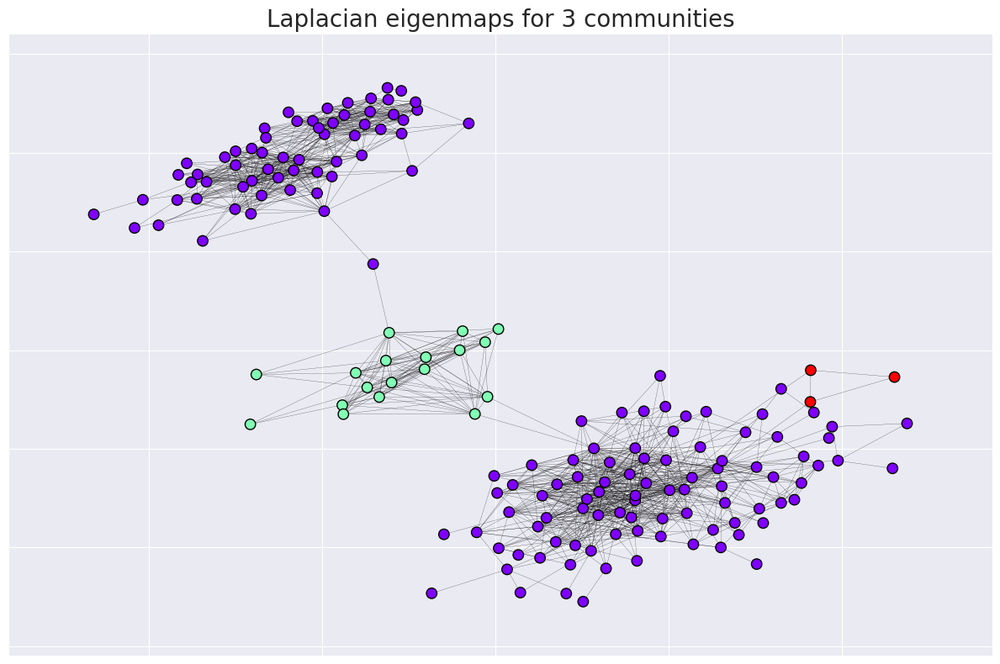

In [74]:
labels = spectral_clustering(G, 3, 5)

plt.figure(figsize=(12, 8))
nx.draw_networkx(
    G = G,
    pos = layout,
    with_labels = False,
    cmap=plt.cm.rainbow,
    node_size = 80,
    node_color = labels,
    width = 0.15,
    edgecolors="black"
)
plt.title("Laplacian eigenmaps for 3 communities", fontsize=20)
plt.show()

Here we also get bad picture: maybe, there is a complex structure. Previous methods were better.